# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored in 2016 and has seen impressive results in generating new images; you can read the [original paper, here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [CIFAR10](https://www.cs.toronto.edu/~kriz/cifar.html) dataset. These are color images of different classes, such as airplanes, dogs or trucks. This dataset is much more complex and diverse than the MNIST dataset and justifies the use of the DCGAN architecture.

<img src='assets/cifar10_data.png' width=80% />


So, our goal is to create a DCGAN that can generate new, realistic-looking images. We'll go through the following steps to do this:
* **Load in and pre-process the CIFAR10 dataset**
* Define discriminator and generator networks
* **Train these adversarial networks**
* **Visualize the loss over time and some sample, generated images**

In this notebook, we will focus on defining the networks.

#### Deeper Convolutional Networks

Since this dataset is more complex than our MNIST data, we'll need a deeper network to accurately identify patterns in these images and be able to generate new ones. Specifically, we'll use a series of convolutional or transpose convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get these convolutional networks to train. 

Besides these changes in network structure, training the discriminator and generator networks should be the same as before. That is, the discriminator will alternate training on real and fake (generated) images, and the generator will aim to trick the discriminator into thinking that its generated images are real!

In [1]:
# # run this cell once to install the dependency. 
# You will have to restart the kernel once the package is installed.
!pip install ipywidgets

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 138 kB 4.5 MB/s eta 0:00:01
     |████████████████████████████████| 2.3 MB 22.2 MB/s eta 0:00:01
     |████████████████████████████████| 214 kB 38.8 MB/s eta 0:00:01


In [2]:
# import libraries
import matplotlib.pyplot as plt
import numpy as np
import pickle as pkl

%matplotlib inline

## Getting the data

Here you can download the CIFAR10 dataset. It's a dataset built-in to the PyTorch datasets library. We can load in training data, transform it into Tensor datatypes, then create dataloaders to batch our data into a desired size.

In [3]:
import torch
from torchvision import datasets
from torchvision import transforms

# Tensor transform
transform = transforms.ToTensor()

# CIFAR training datasets
cifar_train = datasets.CIFAR10(root='data/', train=True, download=True, transform=transform)

batch_size = 128
num_workers = 4

# build DataLoaders for CIFAR10 dataset
train_loader = torch.utils.data.DataLoader(dataset=cifar_train,
                                           batch_size=batch_size,
                                           shuffle=True,
                                           num_workers=num_workers)

Files already downloaded and verified


### Visualize the Data

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real, training images that we'll pass to the discriminator. Notice that each image has _one_ associated, numerical label.

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  if __name__ == '__main__':


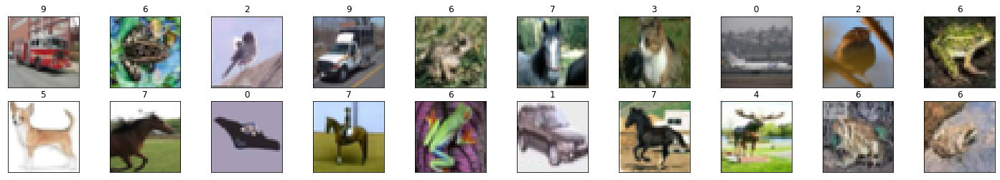

In [4]:
# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = dataiter.next()

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, plot_size/2, idx+1, xticks=[], yticks=[])
    ax.imshow(np.transpose(images[idx], (1, 2, 0)))
    # print out the correct label for each image
    # .item() gets the value contained in a Tensor
    ax.set_title(str(labels[idx].item()))

### Pre-processing: scaling from -1 to 1

We need to do a bit of pre-processing; we know that the output of our `tanh` activated generator will contain pixel values in a range from -1 to 1, and so, we need to rescale our training images to a range of -1 to 1. (Right now, they are in a range from 0-1.)

In [5]:
# current range
img = images[0]

print('Min: ', img.min())
print('Max: ', img.max())

Min:  tensor(0.0353)
Max:  tensor(1.)


In [6]:
# helper scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    ####
    # IMPLEMENT HERE
    ####
    a, b = feature_range
    x = x * (b - a) + a
    return x


In [7]:
# scaled range
scaled_img = scale(img)

print('Scaled min: ', scaled_img.min())
print('Scaled max: ', scaled_img.max())

Scaled min:  tensor(-0.9294)
Scaled max:  tensor(1.)


In [8]:
import torch.distributions.uniform as u

def get_random_latent_batch(batch_size, z_size):
    # z = u.Uniform(-1, 1).sample((batch_size, z_size, 1, 1)) # Added 1,1 dimensions (compared to exercise part 1)    
    z = scale(torch.randn(batch_size, z_size, 1, 1))  # Changed from Exercise part 1, added dimensions
    return z.cuda() if train_on_gpu else z

---
# Define the Model

A GAN is comprised of two adversarial networks, a discriminator and a generator. Let's use the models we created in the previous exercise.

## Discriminator

Here you'll build the discriminator. This is a convolutional classifier like you've built before, only without any maxpooling layers. 
* The inputs to the discriminator are 32x32x3 tensor images
* You'll want a few convolutional, hidden layers
* Then a fully connected layer for the output; as before, we want a sigmoid output, but we'll add that in the loss function, [BCEWithLogitsLoss](https://pytorch.org/docs/stable/nn.html#bcewithlogitsloss), later


In [9]:
import torch.nn as nn

In [10]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [11]:
class Discriminator(nn.Module):
    """
    The discriminator model adapted from the DCGAN paper. It should only contains a few layers.
    args:
    - conv_dim: control the number of filters
    """
    def __init__(self, conv_dim: int):
        super(Discriminator, self).__init__()

        # complete init function
        self.conv_dim = conv_dim

        # 32x32 input
        self.conv1 = ConvBlock(3, conv_dim, 4, batch_norm=False) # first layer, no batch_norm
        # 16x16 out
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4)
        # 8x8 out
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4)
        # 4x4 out
        
        self.flatten = nn.Flatten()
        # final, fully-connected layer
        self.fc = nn.Linear(conv_dim*4*4*4, 1)

    def forward(self, x):
        # all hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        # flatten
        x = self.flatten(x)
        # final output layer
        x = self.fc(x)        
        return x

## Generator

Next, you'll build the generator network. The input will be our noise vector `z`, as before. And, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our CIFAR10 images.

In [12]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

class Generator(nn.Module):
    """
    The generator model adapted from DCGAN
    args:
    - latent_dim: dimension of the latent vector
    - conv_dim: control the number of filters in the convtranspose layers
    """
    def __init__(self, latent_dim: int, conv_dim: int = 32):
        super(Generator, self).__init__()
        # transpose conv layers
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*4, 4, 1, 0)
        self.deconv2 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.deconv3 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)
        self.deconv4 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()
        
    def forward(self, x):
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.last_activation(x)
        return x
    

In [13]:
class Generator(nn.Module):
    """
    The generator model adapted from DCGAN
    args:
    - latent_dim: dimension of the latent vector
    - conv_dim: control the number of filters in the convtranspose layers
    """
    def __init__(self, latent_dim: int, conv_dim: int = 32):
        super(Generator, self).__init__()
        ####
        # IMPLEMENT HERE
        ####
        first_conv_dim = conv_dim // 8  # Because we have 3 conv layers that duplicate size (2^3 == 8)
        self.fc1 = nn.Linear(latent_dim, 512 * first_conv_dim ** 2) # 512*4*4
        self.unflatten = nn.Unflatten(1, (512, first_conv_dim, first_conv_dim) )  # 512x4x4, prepare shape for tconv
        # padding=1 to exactly duplicate sizes
        self.tconv_block1 = DeconvBlock(512, 256, kernel_size=4, stride=2, padding=1) # Out: 256x8x8]
        self.tconv_block2 = DeconvBlock(256, 128, kernel_size=4, stride=2, padding=1) # Out: 128*16*16
        self.tconv_3 = nn.ConvTranspose2d(128, 3, kernel_size=4, stride=2, padding=1) # Out: 3x32x32
        self.final_activation = nn.Tanh()

    def forward(self, x):
        ####
        # IMPLEMENT HERE
        ####
                          # x.size() == [16, 128, 1, 1]   (16 == batch_size)
        x = x.squeeze()          # size [16, 128]
        x = self.fc1(x)          # size [16, 8192] (8192 == 512*4*4)
        x = self.unflatten(x)    # size [16, 512, 4, 4]
        x = self.tconv_block1(x) # size [16, 256, 8, 8]
        x = self.tconv_block2(x) # size [16, 128, 16, 16]
        x = self.tconv_3(x)      # size [16, 3, 32, 32]
        x = self.final_activation(x)
        return x

## Build complete network

Define your models' hyperparameters and instantiate the discriminator and generator from the classes defined above. Make sure you've passed in the correct input arguments.

In [14]:
# define hyperparams
conv_dim = 32
z_size = 100

# define discriminator and generator
D = Discriminator(conv_dim)
G = Generator(latent_dim=z_size, conv_dim=conv_dim)

### Training on GPU

Check if you can train on GPU. If you can, set this as a variable and move your models to GPU. 
> Later, we'll also move any inputs our models and loss functions see (real_images, z, and ground truth labels) to GPU as well.

In [15]:
train_on_gpu = torch.cuda.is_available()

if train_on_gpu:
    # move models to GPU
    G.cuda()
    D.cuda()
    print('GPU available for training. Models moved to GPU')
else:
    print('Training on CPU.')
    

GPU available for training. Models moved to GPU


In [16]:
class Generator2(nn.Module):
    """
    The generator model adapted from DCGAN
    args:
    - latent_dim: dimension of the latent vector
    - conv_dim: control the number of filters in the convtranspose layers
    """
    def __init__(self, latent_dim: int, conv_dim: int = 32):
        super(Generator2, self).__init__()
        # transpose conv layers
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*4, 4, 1, 0)
        self.deconv2 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.deconv3 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)
        self.deconv4 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()
        
    def forward(self, x):
        print('x.size 0: ', x.size())
        x = self.deconv1(x)
        print('x.size 1: ', x.size())
        x = self.deconv2(x)
        print('x.size 2: ', x.size())
        x = self.deconv3(x)
        print('x.size 3: ', x.size())
        x = self.deconv4(x)
        print('x.size 4: ', x.size())
        x = self.last_activation(x)
        return x
    
def test_gen2():
    G2 = Generator2(latent_dim=z_size, conv_dim=conv_dim).cpu()
    test_batch_size = 5
    test_z = get_random_latent_batch(test_batch_size, z_size).cpu()
    G2(test_z)
    
test_gen2()

x.size 0:  torch.Size([5, 100, 1, 1])
x.size 1:  torch.Size([5, 128, 4, 4])
x.size 2:  torch.Size([5, 64, 8, 8])
x.size 3:  torch.Size([5, 32, 16, 16])
x.size 4:  torch.Size([5, 3, 32, 32])


---
## Discriminator and Generator Losses

Now we need to calculate the losses. And this will be exactly the same as before.

### Discriminator Losses

> * For the discriminator, the total loss is the sum of the losses for real and fake images, `d_loss = d_real_loss + d_fake_loss`. 
* Remember that we want the discriminator to output 1 for real images and 0 for fake images, so we need to set up the losses to reflect that.

The losses will by binary cross entropy loss with logits, which we can get with [BCEWithLogitsLoss](https://pytorch.org/docs/stable/nn.html#bcewithlogitsloss). This combines a `sigmoid` activation function **and** and binary cross entropy loss in one function.

For the real images, we want `D(real_images) = 1`. That is, we want the discriminator to classify the real images with a label = 1, indicating that these are real. The discriminator loss for the fake data is similar. We want `D(fake_images) = 0`, where the fake images are the _generator output_, `fake_images = G(z)`. 

### Generator Loss

The generator loss will look similar only with flipped labels. The generator's goal is to get `D(fake_images) = 1`. In this case, the labels are **flipped** to represent that the generator is trying to fool the discriminator into thinking that the images it generates (fakes) are real!

In [17]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

## Optimizers

Not much new here, but notice how I am using a small learning rate and custom parameters for the Adam optimizers, This is based on some research into DCGAN model convergence.

### Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [18]:
import torch.optim as optim

# IMPLEMENT BELOW
# params (got values from paper)
lr = 0.0002 
beta1 = 0.5
beta2 = 0.999

# Create optimizers for the discriminator and generator
d_optimizer = optim.Adam(D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(G.parameters(), lr, [beta1, beta2])

---
## Training

Training will involve alternating between training the discriminator and the generator. We'll use our functions `real_loss` and `fake_loss` to help us calculate the discriminator losses in all of the following cases.

### Discriminator training
1. Compute the discriminator loss on real, training images        
2. Generate fake images
3. Compute the discriminator loss on fake, generated images     
4. Add up real and fake loss
5. Perform backpropagation + an optimization step to update the discriminator's weights

### Generator training
1. Generate fake images
2. Compute the discriminator loss on fake images, using **flipped** labels!
3. Perform backpropagation + an optimization step to update the generator's weights

#### Saving Samples

As we train, we'll also print out some loss statistics and save some generated "fake" samples.

**Evaluation mode**

Notice that, when we call our generator to create the samples to display, we set our model to evaluation mode: `G.eval()`. That's so the batch normalization layers will use the population statistics rather than the batch statistics (as they do during training), *and* so dropout layers will operate in eval() mode; not turning off any nodes for generating samples.

In [19]:
import pickle as pkl
from datetime import datetime

In [20]:
# helper function for viewing a list of passed in sample images
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(14,4), nrows=2, ncols=8, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = ((img +1)*255 / (2)).astype(np.uint8) # rescale to pixel range (0-255)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((32,32,3)))
    plt.show()

2023-07-19 02:03:12 | Epoch [1/50] | Batch 0/391 | d_loss: 1.4754 | g_loss: 0.9568
2023-07-19 02:03:29 | Epoch [1/50] | Batch 100/391 | d_loss: 0.8648 | g_loss: 2.5370
2023-07-19 02:03:47 | Epoch [1/50] | Batch 200/391 | d_loss: 0.7184 | g_loss: 2.6681
2023-07-19 02:04:04 | Epoch [1/50] | Batch 300/391 | d_loss: 0.6438 | g_loss: 2.7089


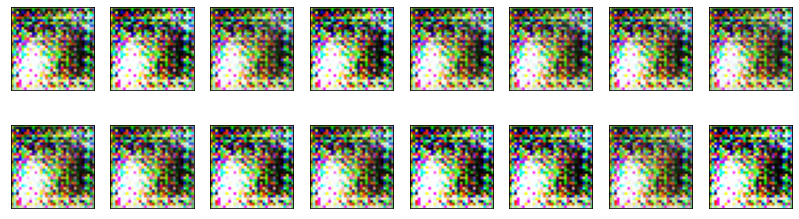

2023-07-19 02:04:23 | Epoch [2/50] | Batch 0/391 | d_loss: 0.5863 | g_loss: 2.9060
2023-07-19 02:04:41 | Epoch [2/50] | Batch 100/391 | d_loss: 0.5466 | g_loss: 3.4029
2023-07-19 02:04:59 | Epoch [2/50] | Batch 200/391 | d_loss: 0.5410 | g_loss: 2.9009
2023-07-19 02:05:17 | Epoch [2/50] | Batch 300/391 | d_loss: 1.4631 | g_loss: 1.6806


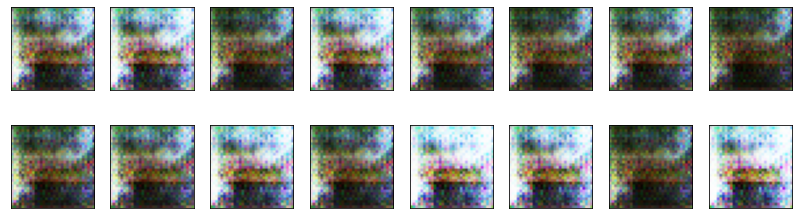

2023-07-19 02:05:36 | Epoch [3/50] | Batch 0/391 | d_loss: 0.8703 | g_loss: 2.3133
2023-07-19 02:05:54 | Epoch [3/50] | Batch 100/391 | d_loss: 0.7539 | g_loss: 2.6706
2023-07-19 02:06:12 | Epoch [3/50] | Batch 200/391 | d_loss: 0.8555 | g_loss: 3.0726
2023-07-19 02:06:29 | Epoch [3/50] | Batch 300/391 | d_loss: 0.5602 | g_loss: 3.0796


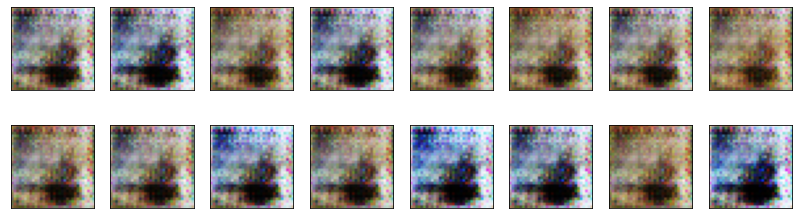

2023-07-19 02:06:48 | Epoch [4/50] | Batch 0/391 | d_loss: 0.5539 | g_loss: 3.4750
2023-07-19 02:07:05 | Epoch [4/50] | Batch 100/391 | d_loss: 0.5114 | g_loss: 3.5535
2023-07-19 02:07:23 | Epoch [4/50] | Batch 200/391 | d_loss: 0.5736 | g_loss: 3.4550
2023-07-19 02:07:41 | Epoch [4/50] | Batch 300/391 | d_loss: 0.4966 | g_loss: 3.7553


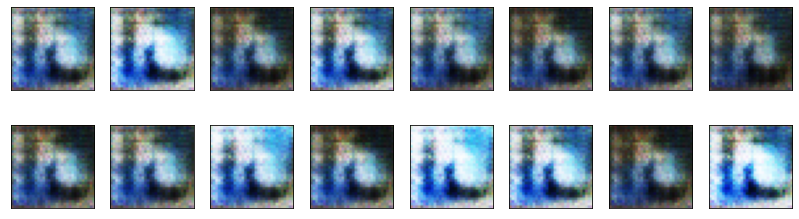

2023-07-19 02:08:00 | Epoch [5/50] | Batch 0/391 | d_loss: 0.4656 | g_loss: 4.0987
2023-07-19 02:08:17 | Epoch [5/50] | Batch 100/391 | d_loss: 0.4961 | g_loss: 3.7203
2023-07-19 02:08:35 | Epoch [5/50] | Batch 200/391 | d_loss: 0.4343 | g_loss: 4.0762
2023-07-19 02:08:53 | Epoch [5/50] | Batch 300/391 | d_loss: 0.4104 | g_loss: 4.3968


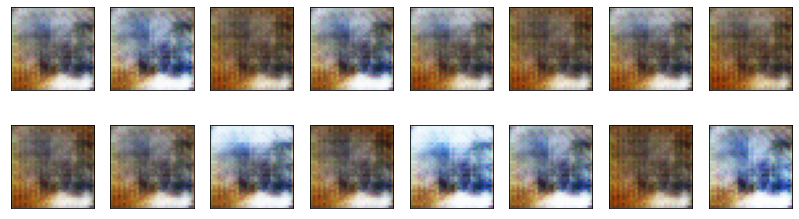

2023-07-19 02:09:12 | Epoch [6/50] | Batch 0/391 | d_loss: 0.6425 | g_loss: 5.0773
2023-07-19 02:09:30 | Epoch [6/50] | Batch 100/391 | d_loss: 0.4247 | g_loss: 3.9940
2023-07-19 02:09:47 | Epoch [6/50] | Batch 200/391 | d_loss: 0.4198 | g_loss: 3.8338
2023-07-19 02:10:05 | Epoch [6/50] | Batch 300/391 | d_loss: 0.3873 | g_loss: 4.0123


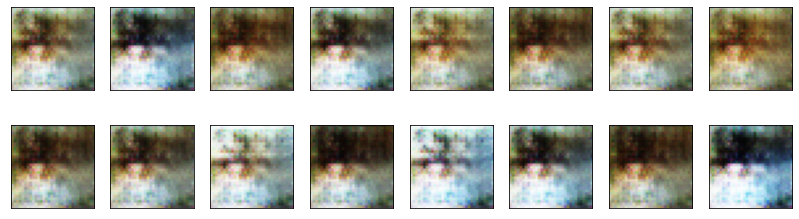

2023-07-19 02:10:24 | Epoch [7/50] | Batch 0/391 | d_loss: 0.4588 | g_loss: 3.9001
2023-07-19 02:10:42 | Epoch [7/50] | Batch 100/391 | d_loss: 0.4278 | g_loss: 3.7260
2023-07-19 02:11:00 | Epoch [7/50] | Batch 200/391 | d_loss: 0.4293 | g_loss: 4.1046
2023-07-19 02:11:17 | Epoch [7/50] | Batch 300/391 | d_loss: 0.4920 | g_loss: 4.2183


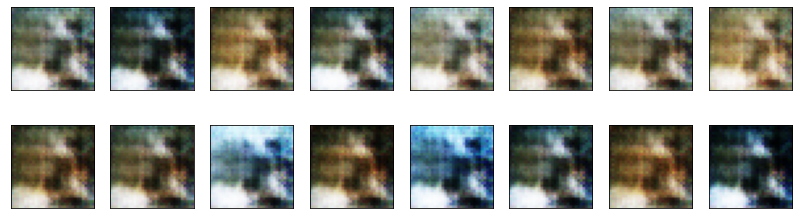

2023-07-19 02:11:36 | Epoch [8/50] | Batch 0/391 | d_loss: 0.4092 | g_loss: 4.3795
2023-07-19 02:11:54 | Epoch [8/50] | Batch 100/391 | d_loss: 0.4177 | g_loss: 5.0711
2023-07-19 02:12:11 | Epoch [8/50] | Batch 200/391 | d_loss: 0.4669 | g_loss: 4.3013
2023-07-19 02:12:29 | Epoch [8/50] | Batch 300/391 | d_loss: 0.4749 | g_loss: 4.3987


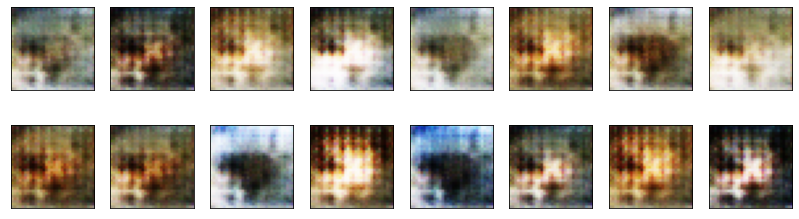

2023-07-19 02:12:48 | Epoch [9/50] | Batch 0/391 | d_loss: 0.4225 | g_loss: 3.9512
2023-07-19 02:13:05 | Epoch [9/50] | Batch 100/391 | d_loss: 0.5301 | g_loss: 4.7154
2023-07-19 02:13:23 | Epoch [9/50] | Batch 200/391 | d_loss: 0.6799 | g_loss: 3.5037
2023-07-19 02:13:40 | Epoch [9/50] | Batch 300/391 | d_loss: 0.5613 | g_loss: 5.5332


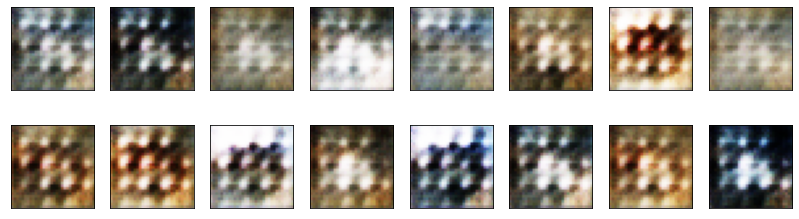

2023-07-19 02:13:59 | Epoch [10/50] | Batch 0/391 | d_loss: 0.4958 | g_loss: 4.1082
2023-07-19 02:14:17 | Epoch [10/50] | Batch 100/391 | d_loss: 0.5323 | g_loss: 4.8596
2023-07-19 02:14:35 | Epoch [10/50] | Batch 200/391 | d_loss: 0.4873 | g_loss: 4.2991
2023-07-19 02:14:52 | Epoch [10/50] | Batch 300/391 | d_loss: 0.4490 | g_loss: 3.6623


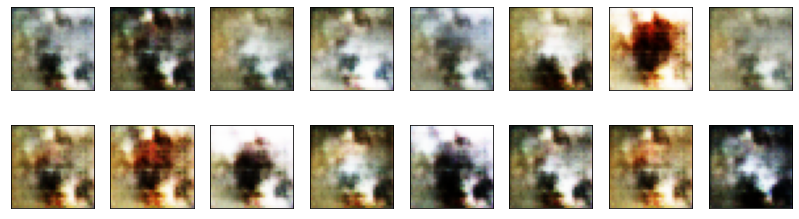

2023-07-19 02:15:11 | Epoch [11/50] | Batch 0/391 | d_loss: 0.4410 | g_loss: 4.2529
2023-07-19 02:15:29 | Epoch [11/50] | Batch 100/391 | d_loss: 0.4831 | g_loss: 4.1247
2023-07-19 02:15:46 | Epoch [11/50] | Batch 200/391 | d_loss: 0.4441 | g_loss: 4.2494
2023-07-19 02:16:04 | Epoch [11/50] | Batch 300/391 | d_loss: 0.6522 | g_loss: 4.9660


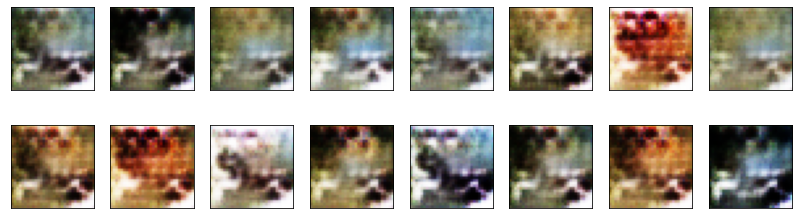

2023-07-19 02:16:23 | Epoch [12/50] | Batch 0/391 | d_loss: 0.4904 | g_loss: 3.9610
2023-07-19 02:16:41 | Epoch [12/50] | Batch 100/391 | d_loss: 0.4992 | g_loss: 5.0087
2023-07-19 02:16:59 | Epoch [12/50] | Batch 200/391 | d_loss: 0.4888 | g_loss: 4.8857
2023-07-19 02:17:17 | Epoch [12/50] | Batch 300/391 | d_loss: 0.4670 | g_loss: 4.1904


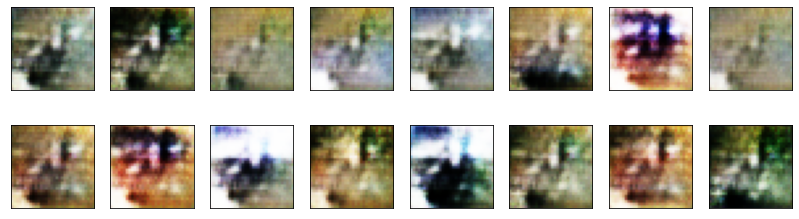

2023-07-19 02:17:36 | Epoch [13/50] | Batch 0/391 | d_loss: 0.4955 | g_loss: 3.8439
2023-07-19 02:17:54 | Epoch [13/50] | Batch 100/391 | d_loss: 0.5061 | g_loss: 4.7785
2023-07-19 02:18:12 | Epoch [13/50] | Batch 200/391 | d_loss: 0.6355 | g_loss: 3.0244
2023-07-19 02:18:30 | Epoch [13/50] | Batch 300/391 | d_loss: 0.6222 | g_loss: 3.2784


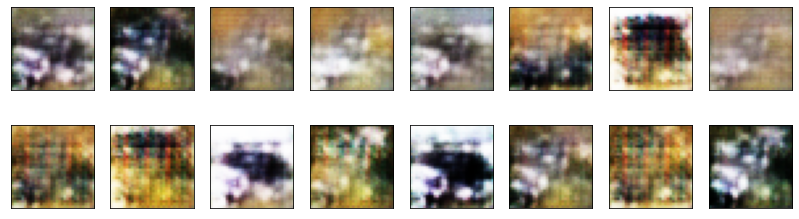

2023-07-19 02:18:50 | Epoch [14/50] | Batch 0/391 | d_loss: 0.4958 | g_loss: 3.7655
2023-07-19 02:19:08 | Epoch [14/50] | Batch 100/391 | d_loss: 0.5596 | g_loss: 4.0769
2023-07-19 02:19:26 | Epoch [14/50] | Batch 200/391 | d_loss: 0.4762 | g_loss: 3.6726
2023-07-19 02:19:44 | Epoch [14/50] | Batch 300/391 | d_loss: 0.6183 | g_loss: 3.1175


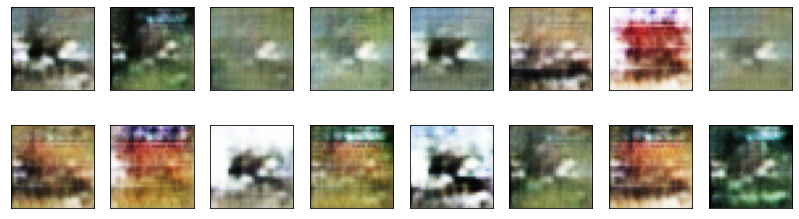

2023-07-19 02:20:03 | Epoch [15/50] | Batch 0/391 | d_loss: 0.4744 | g_loss: 4.5389
2023-07-19 02:20:22 | Epoch [15/50] | Batch 100/391 | d_loss: 0.6018 | g_loss: 3.5970
2023-07-19 02:20:40 | Epoch [15/50] | Batch 200/391 | d_loss: 0.4811 | g_loss: 3.8018
2023-07-19 02:20:59 | Epoch [15/50] | Batch 300/391 | d_loss: 0.4899 | g_loss: 2.6211


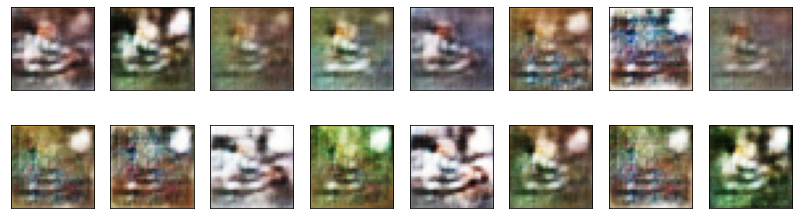

2023-07-19 02:21:18 | Epoch [16/50] | Batch 0/391 | d_loss: 0.4743 | g_loss: 3.8351
2023-07-19 02:21:37 | Epoch [16/50] | Batch 100/391 | d_loss: 0.5897 | g_loss: 3.1392
2023-07-19 02:21:55 | Epoch [16/50] | Batch 200/391 | d_loss: 0.5809 | g_loss: 3.3929
2023-07-19 02:22:14 | Epoch [16/50] | Batch 300/391 | d_loss: 0.5857 | g_loss: 2.3976


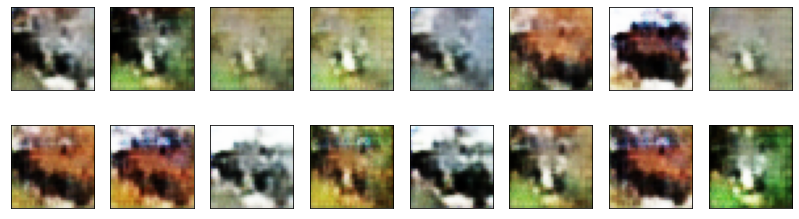

2023-07-19 02:22:34 | Epoch [17/50] | Batch 0/391 | d_loss: 0.5582 | g_loss: 3.7765
2023-07-19 02:22:53 | Epoch [17/50] | Batch 100/391 | d_loss: 0.8513 | g_loss: 1.7993
2023-07-19 02:23:11 | Epoch [17/50] | Batch 200/391 | d_loss: 0.5440 | g_loss: 4.5454
2023-07-19 02:23:30 | Epoch [17/50] | Batch 300/391 | d_loss: 0.7651 | g_loss: 4.7246


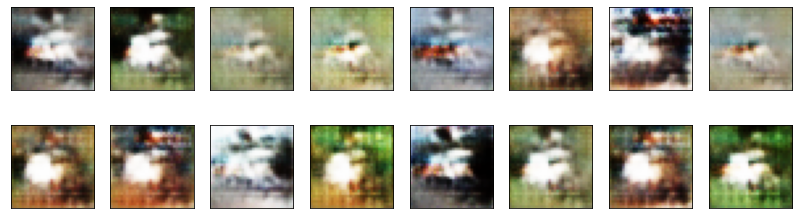

2023-07-19 02:23:50 | Epoch [18/50] | Batch 0/391 | d_loss: 0.5788 | g_loss: 4.2333
2023-07-19 02:24:09 | Epoch [18/50] | Batch 100/391 | d_loss: 0.4742 | g_loss: 3.9499
2023-07-19 02:24:27 | Epoch [18/50] | Batch 200/391 | d_loss: 0.4322 | g_loss: 5.0012
2023-07-19 02:24:46 | Epoch [18/50] | Batch 300/391 | d_loss: 0.6361 | g_loss: 3.1703


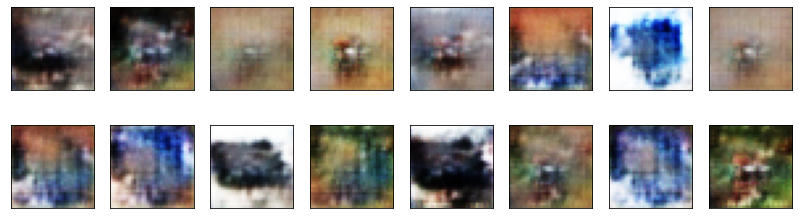

2023-07-19 02:25:05 | Epoch [19/50] | Batch 0/391 | d_loss: 0.5020 | g_loss: 3.8077
2023-07-19 02:25:24 | Epoch [19/50] | Batch 100/391 | d_loss: 1.2308 | g_loss: 7.0450
2023-07-19 02:25:43 | Epoch [19/50] | Batch 200/391 | d_loss: 0.4867 | g_loss: 3.8563
2023-07-19 02:26:02 | Epoch [19/50] | Batch 300/391 | d_loss: 0.5154 | g_loss: 4.0642


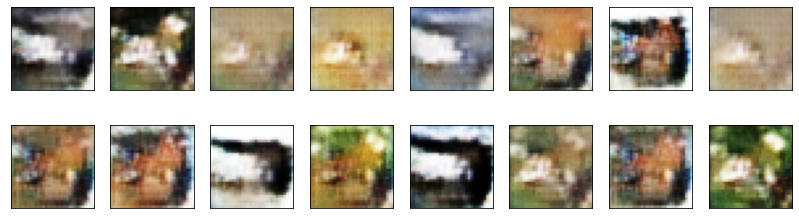

2023-07-19 02:26:22 | Epoch [20/50] | Batch 0/391 | d_loss: 0.5061 | g_loss: 3.1914
2023-07-19 02:26:41 | Epoch [20/50] | Batch 100/391 | d_loss: 0.7076 | g_loss: 5.0008
2023-07-19 02:27:00 | Epoch [20/50] | Batch 200/391 | d_loss: 0.5590 | g_loss: 3.1301
2023-07-19 02:27:19 | Epoch [20/50] | Batch 300/391 | d_loss: 0.4204 | g_loss: 3.8790


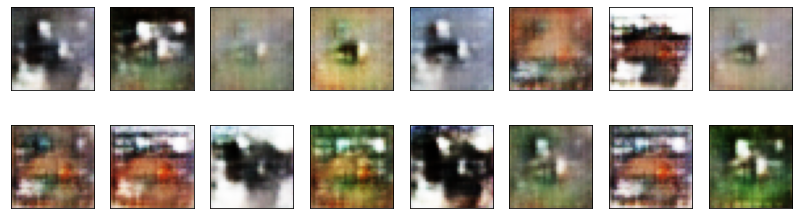

2023-07-19 02:27:39 | Epoch [21/50] | Batch 0/391 | d_loss: 0.6558 | g_loss: 4.1086
2023-07-19 02:27:59 | Epoch [21/50] | Batch 100/391 | d_loss: 0.5004 | g_loss: 3.6007
2023-07-19 02:28:18 | Epoch [21/50] | Batch 200/391 | d_loss: 0.4724 | g_loss: 3.6052
2023-07-19 02:28:37 | Epoch [21/50] | Batch 300/391 | d_loss: 0.4233 | g_loss: 5.0991


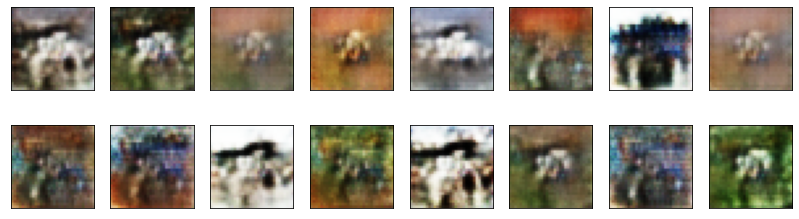

2023-07-19 02:28:57 | Epoch [22/50] | Batch 0/391 | d_loss: 0.4445 | g_loss: 6.4597
2023-07-19 02:29:17 | Epoch [22/50] | Batch 100/391 | d_loss: 0.4935 | g_loss: 4.4644
2023-07-19 02:29:36 | Epoch [22/50] | Batch 200/391 | d_loss: 0.5266 | g_loss: 2.8957
2023-07-19 02:29:55 | Epoch [22/50] | Batch 300/391 | d_loss: 0.4711 | g_loss: 3.8612


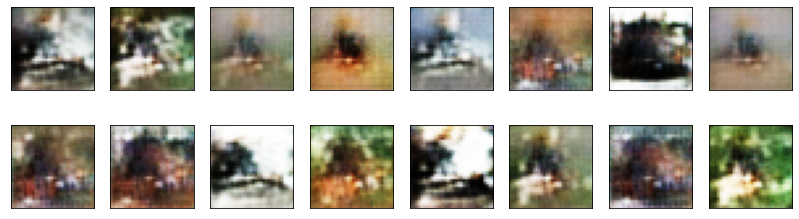

2023-07-19 02:30:15 | Epoch [23/50] | Batch 0/391 | d_loss: 0.5812 | g_loss: 3.9453
2023-07-19 02:30:34 | Epoch [23/50] | Batch 100/391 | d_loss: 0.5115 | g_loss: 3.3732
2023-07-19 02:30:54 | Epoch [23/50] | Batch 200/391 | d_loss: 0.4715 | g_loss: 4.4479
2023-07-19 02:31:13 | Epoch [23/50] | Batch 300/391 | d_loss: 0.4622 | g_loss: 3.6129


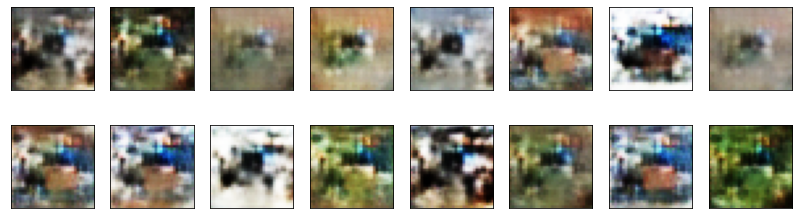

2023-07-19 02:31:33 | Epoch [24/50] | Batch 0/391 | d_loss: 0.5989 | g_loss: 4.4591
2023-07-19 02:31:53 | Epoch [24/50] | Batch 100/391 | d_loss: 0.5762 | g_loss: 4.4121
2023-07-19 02:32:11 | Epoch [24/50] | Batch 200/391 | d_loss: 0.4518 | g_loss: 4.1886
2023-07-19 02:32:30 | Epoch [24/50] | Batch 300/391 | d_loss: 0.5681 | g_loss: 3.4695


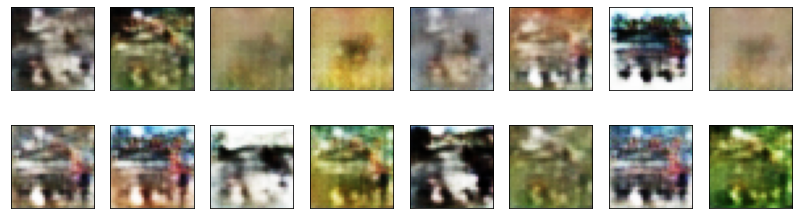

2023-07-19 02:32:51 | Epoch [25/50] | Batch 0/391 | d_loss: 0.4982 | g_loss: 3.9759
2023-07-19 02:33:10 | Epoch [25/50] | Batch 100/391 | d_loss: 0.5513 | g_loss: 4.2956
2023-07-19 02:33:30 | Epoch [25/50] | Batch 200/391 | d_loss: 0.5190 | g_loss: 3.6967
2023-07-19 02:33:49 | Epoch [25/50] | Batch 300/391 | d_loss: 1.5409 | g_loss: 2.3164


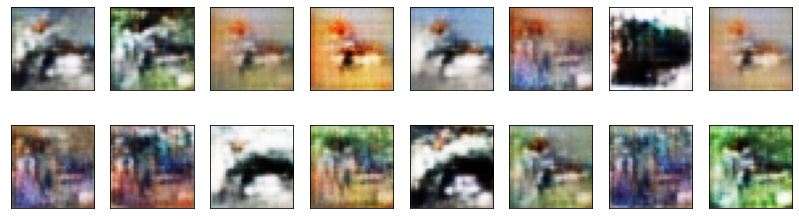

2023-07-19 02:34:09 | Epoch [26/50] | Batch 0/391 | d_loss: 0.4395 | g_loss: 4.3230
2023-07-19 02:34:29 | Epoch [26/50] | Batch 100/391 | d_loss: 0.5653 | g_loss: 3.1801
2023-07-19 02:34:47 | Epoch [26/50] | Batch 200/391 | d_loss: 0.4921 | g_loss: 3.7904
2023-07-19 02:35:06 | Epoch [26/50] | Batch 300/391 | d_loss: 0.4048 | g_loss: 6.9671


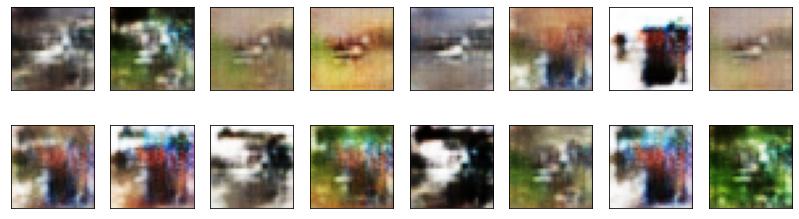

2023-07-19 02:35:27 | Epoch [27/50] | Batch 0/391 | d_loss: 0.8325 | g_loss: 3.0228
2023-07-19 02:35:45 | Epoch [27/50] | Batch 100/391 | d_loss: 0.5232 | g_loss: 3.5497
2023-07-19 02:36:04 | Epoch [27/50] | Batch 200/391 | d_loss: 0.5415 | g_loss: 3.1436
2023-07-19 02:36:22 | Epoch [27/50] | Batch 300/391 | d_loss: 0.6906 | g_loss: 2.9495


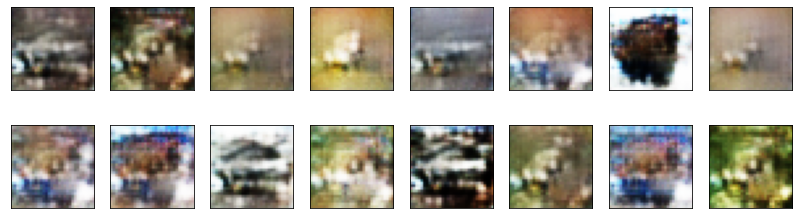

2023-07-19 02:36:42 | Epoch [28/50] | Batch 0/391 | d_loss: 0.5465 | g_loss: 3.9050
2023-07-19 02:37:01 | Epoch [28/50] | Batch 100/391 | d_loss: 0.5291 | g_loss: 3.8136
2023-07-19 02:37:20 | Epoch [28/50] | Batch 200/391 | d_loss: 0.6070 | g_loss: 2.7431
2023-07-19 02:37:38 | Epoch [28/50] | Batch 300/391 | d_loss: 0.5055 | g_loss: 3.9013


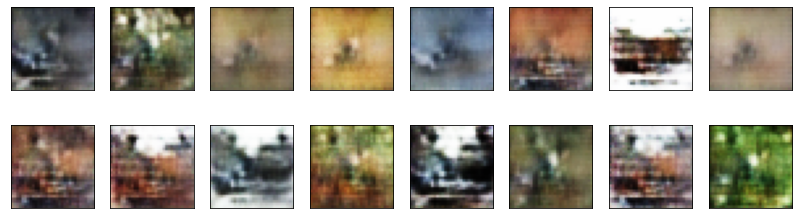

2023-07-19 02:37:59 | Epoch [29/50] | Batch 0/391 | d_loss: 0.4602 | g_loss: 4.2394
2023-07-19 02:38:17 | Epoch [29/50] | Batch 100/391 | d_loss: 0.5234 | g_loss: 3.7019
2023-07-19 02:38:36 | Epoch [29/50] | Batch 200/391 | d_loss: 0.4915 | g_loss: 3.6222
2023-07-19 02:38:55 | Epoch [29/50] | Batch 300/391 | d_loss: 0.5055 | g_loss: 3.4431


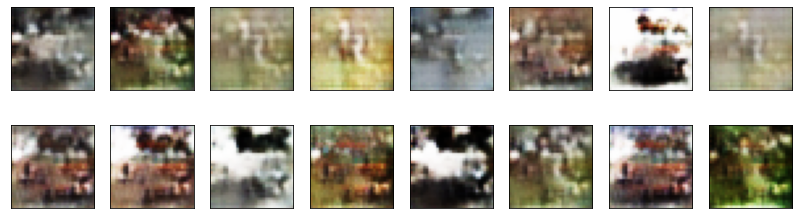

2023-07-19 02:39:15 | Epoch [30/50] | Batch 0/391 | d_loss: 0.5118 | g_loss: 3.4214
2023-07-19 02:39:34 | Epoch [30/50] | Batch 100/391 | d_loss: 0.6418 | g_loss: 2.8316
2023-07-19 02:39:52 | Epoch [30/50] | Batch 200/391 | d_loss: 0.5889 | g_loss: 4.1068
2023-07-19 02:40:11 | Epoch [30/50] | Batch 300/391 | d_loss: 0.5768 | g_loss: 4.0072


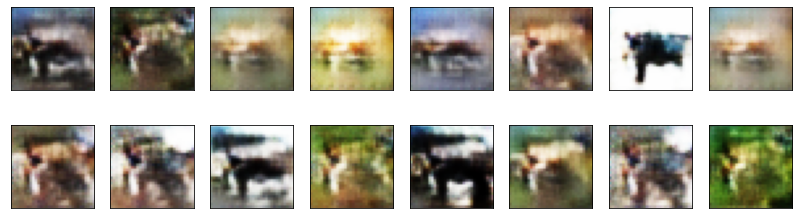

2023-07-19 02:40:31 | Epoch [31/50] | Batch 0/391 | d_loss: 0.5576 | g_loss: 5.5067
2023-07-19 02:40:50 | Epoch [31/50] | Batch 100/391 | d_loss: 0.4320 | g_loss: 4.3628
2023-07-19 02:41:09 | Epoch [31/50] | Batch 200/391 | d_loss: 0.9878 | g_loss: 2.8066
2023-07-19 02:41:28 | Epoch [31/50] | Batch 300/391 | d_loss: 0.4195 | g_loss: 4.4971


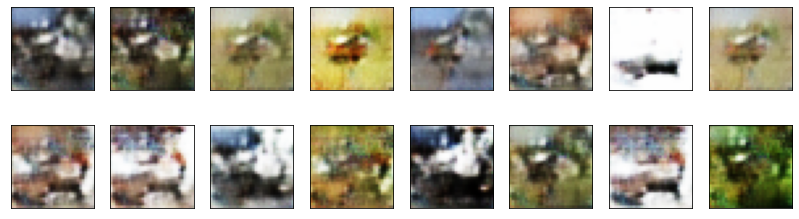

2023-07-19 02:41:48 | Epoch [32/50] | Batch 0/391 | d_loss: 0.5755 | g_loss: 4.0208
2023-07-19 02:42:07 | Epoch [32/50] | Batch 100/391 | d_loss: 0.6532 | g_loss: 2.9054
2023-07-19 02:42:26 | Epoch [32/50] | Batch 200/391 | d_loss: 0.5801 | g_loss: 5.2446
2023-07-19 02:42:46 | Epoch [32/50] | Batch 300/391 | d_loss: 0.4456 | g_loss: 4.5458


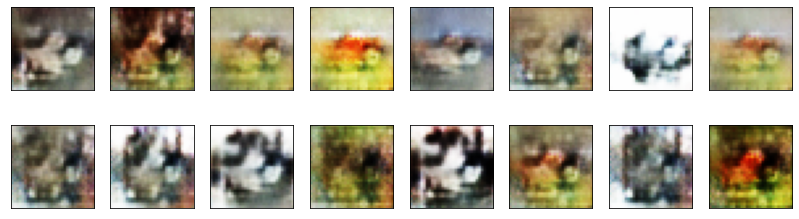

2023-07-19 02:43:06 | Epoch [33/50] | Batch 0/391 | d_loss: 0.4616 | g_loss: 3.7962
2023-07-19 02:43:25 | Epoch [33/50] | Batch 100/391 | d_loss: 0.4715 | g_loss: 3.7749
2023-07-19 02:43:44 | Epoch [33/50] | Batch 200/391 | d_loss: 0.5389 | g_loss: 2.8086
2023-07-19 02:44:02 | Epoch [33/50] | Batch 300/391 | d_loss: 0.4644 | g_loss: 4.1002


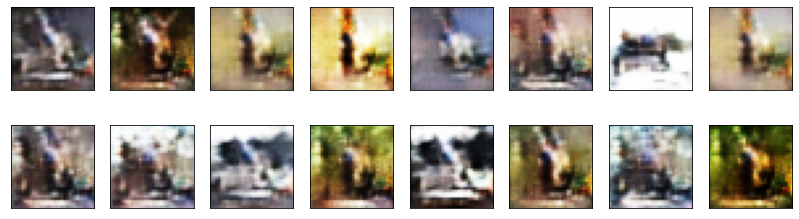

2023-07-19 02:44:22 | Epoch [34/50] | Batch 0/391 | d_loss: 0.4820 | g_loss: 4.3650
2023-07-19 02:44:42 | Epoch [34/50] | Batch 100/391 | d_loss: 0.5054 | g_loss: 4.0930
2023-07-19 02:45:00 | Epoch [34/50] | Batch 200/391 | d_loss: 0.4562 | g_loss: 4.4619
2023-07-19 02:45:19 | Epoch [34/50] | Batch 300/391 | d_loss: 0.4366 | g_loss: 3.2776


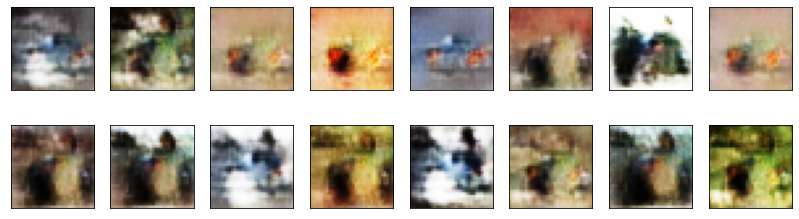

2023-07-19 02:45:39 | Epoch [35/50] | Batch 0/391 | d_loss: 0.4239 | g_loss: 4.3119
2023-07-19 02:45:57 | Epoch [35/50] | Batch 100/391 | d_loss: 0.4904 | g_loss: 3.3494
2023-07-19 02:46:16 | Epoch [35/50] | Batch 200/391 | d_loss: 0.4753 | g_loss: 4.6694
2023-07-19 02:46:35 | Epoch [35/50] | Batch 300/391 | d_loss: 0.5442 | g_loss: 4.4212


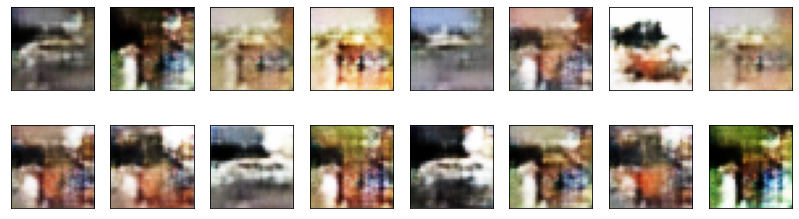

2023-07-19 02:46:56 | Epoch [36/50] | Batch 0/391 | d_loss: 0.5014 | g_loss: 3.3021
2023-07-19 02:47:16 | Epoch [36/50] | Batch 100/391 | d_loss: 0.6279 | g_loss: 4.0004
2023-07-19 02:47:36 | Epoch [36/50] | Batch 200/391 | d_loss: 0.5075 | g_loss: 3.5072
2023-07-19 02:47:55 | Epoch [36/50] | Batch 300/391 | d_loss: 0.5173 | g_loss: 3.6321


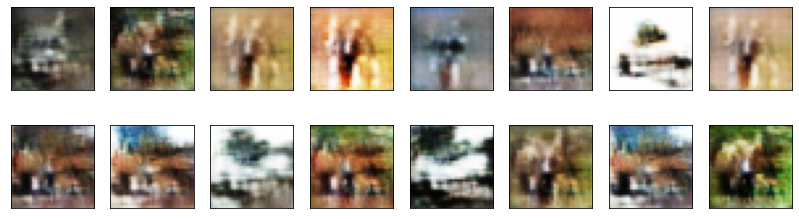

2023-07-19 02:48:16 | Epoch [37/50] | Batch 0/391 | d_loss: 0.4744 | g_loss: 4.4527
2023-07-19 02:48:35 | Epoch [37/50] | Batch 100/391 | d_loss: 0.6327 | g_loss: 4.9044
2023-07-19 02:48:55 | Epoch [37/50] | Batch 200/391 | d_loss: 0.6900 | g_loss: 4.5964
2023-07-19 02:49:17 | Epoch [37/50] | Batch 300/391 | d_loss: 0.5543 | g_loss: 3.9942


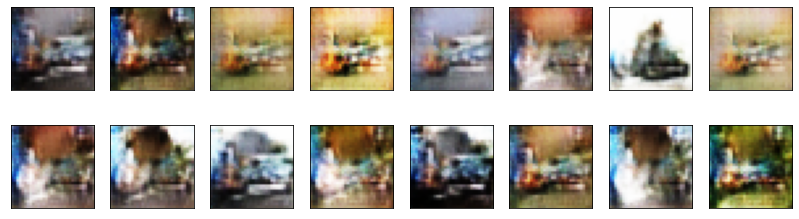

2023-07-19 02:49:48 | Epoch [38/50] | Batch 0/391 | d_loss: 0.5084 | g_loss: 3.8270
2023-07-19 02:50:18 | Epoch [38/50] | Batch 100/391 | d_loss: 0.6614 | g_loss: 3.3419
2023-07-19 02:50:48 | Epoch [38/50] | Batch 200/391 | d_loss: 0.4179 | g_loss: 4.8293
2023-07-19 02:51:18 | Epoch [38/50] | Batch 300/391 | d_loss: 0.5387 | g_loss: 3.9131


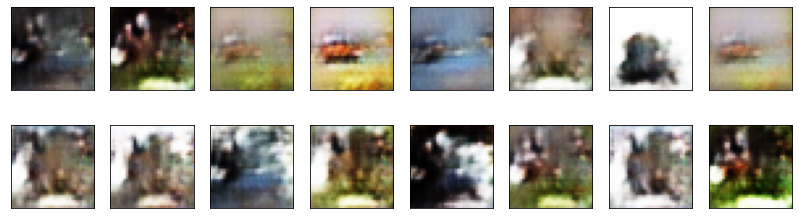

2023-07-19 02:51:49 | Epoch [39/50] | Batch 0/391 | d_loss: 0.4475 | g_loss: 5.7279
2023-07-19 02:52:19 | Epoch [39/50] | Batch 100/391 | d_loss: 0.4335 | g_loss: 4.2694
2023-07-19 02:52:42 | Epoch [39/50] | Batch 200/391 | d_loss: 0.5205 | g_loss: 4.2311
2023-07-19 02:53:01 | Epoch [39/50] | Batch 300/391 | d_loss: 0.5178 | g_loss: 3.6857


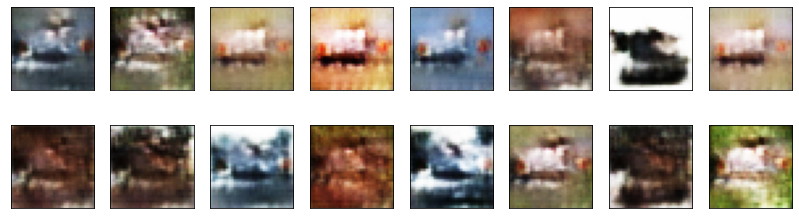

2023-07-19 02:53:21 | Epoch [40/50] | Batch 0/391 | d_loss: 0.5534 | g_loss: 3.1447
2023-07-19 02:53:40 | Epoch [40/50] | Batch 100/391 | d_loss: 0.5901 | g_loss: 4.3308
2023-07-19 02:54:01 | Epoch [40/50] | Batch 200/391 | d_loss: 0.4865 | g_loss: 3.9841
2023-07-19 02:54:31 | Epoch [40/50] | Batch 300/391 | d_loss: 0.4615 | g_loss: 3.3587


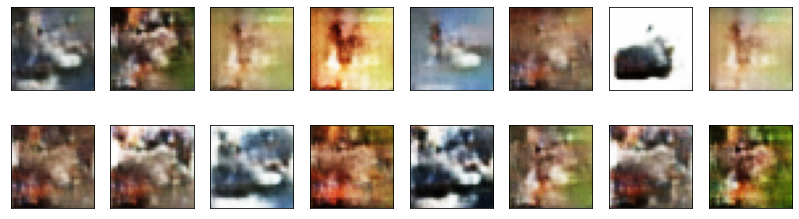

2023-07-19 02:55:01 | Epoch [41/50] | Batch 0/391 | d_loss: 0.5170 | g_loss: 4.0535
2023-07-19 02:55:31 | Epoch [41/50] | Batch 100/391 | d_loss: 0.4552 | g_loss: 3.5112
2023-07-19 02:56:01 | Epoch [41/50] | Batch 200/391 | d_loss: 0.5419 | g_loss: 4.1320
2023-07-19 02:56:31 | Epoch [41/50] | Batch 300/391 | d_loss: 0.5210 | g_loss: 4.0121


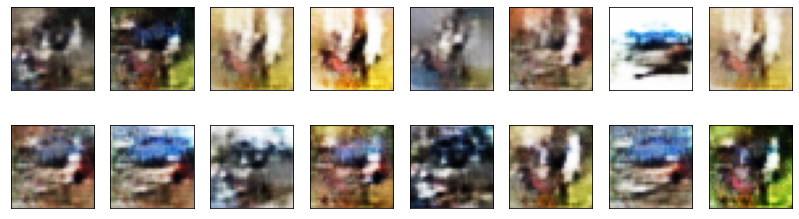

2023-07-19 02:57:02 | Epoch [42/50] | Batch 0/391 | d_loss: 0.4339 | g_loss: 4.1548
2023-07-19 02:57:27 | Epoch [42/50] | Batch 100/391 | d_loss: 0.4977 | g_loss: 3.7463
2023-07-19 02:57:46 | Epoch [42/50] | Batch 200/391 | d_loss: 0.4673 | g_loss: 4.2863
2023-07-19 02:58:05 | Epoch [42/50] | Batch 300/391 | d_loss: 0.5085 | g_loss: 3.3740


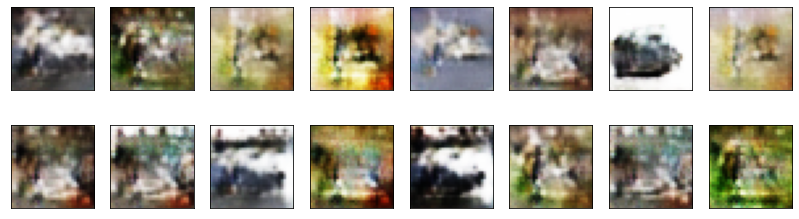

2023-07-19 02:58:25 | Epoch [43/50] | Batch 0/391 | d_loss: 0.4715 | g_loss: 3.4069
2023-07-19 02:58:45 | Epoch [43/50] | Batch 100/391 | d_loss: 0.4711 | g_loss: 3.8688
2023-07-19 02:59:04 | Epoch [43/50] | Batch 200/391 | d_loss: 0.4158 | g_loss: 4.2233
2023-07-19 02:59:23 | Epoch [43/50] | Batch 300/391 | d_loss: 0.5297 | g_loss: 3.5830


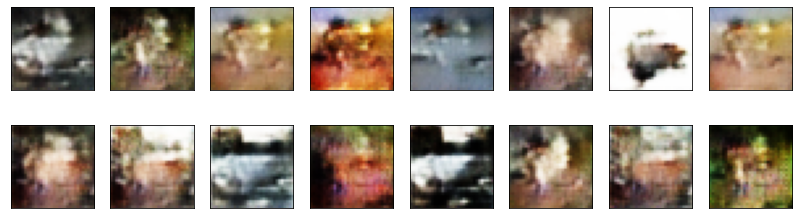

2023-07-19 02:59:44 | Epoch [44/50] | Batch 0/391 | d_loss: 0.6527 | g_loss: 2.5725
2023-07-19 03:00:13 | Epoch [44/50] | Batch 100/391 | d_loss: 0.6631 | g_loss: 3.6320
2023-07-19 03:00:43 | Epoch [44/50] | Batch 200/391 | d_loss: 0.5033 | g_loss: 3.5787
2023-07-19 03:01:14 | Epoch [44/50] | Batch 300/391 | d_loss: 0.4265 | g_loss: 6.8770


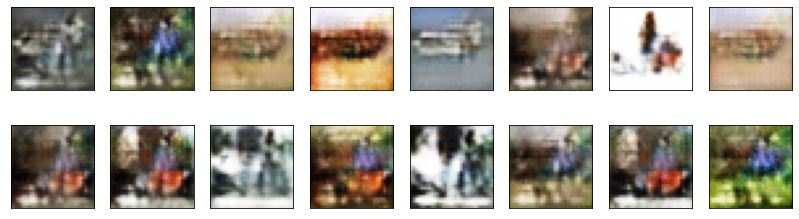

2023-07-19 03:01:44 | Epoch [45/50] | Batch 0/391 | d_loss: 0.4601 | g_loss: 2.6960
2023-07-19 03:02:14 | Epoch [45/50] | Batch 100/391 | d_loss: 0.4778 | g_loss: 3.4772
2023-07-19 03:02:44 | Epoch [45/50] | Batch 200/391 | d_loss: 0.5088 | g_loss: 4.3211
2023-07-19 03:03:13 | Epoch [45/50] | Batch 300/391 | d_loss: 0.4224 | g_loss: 4.4571


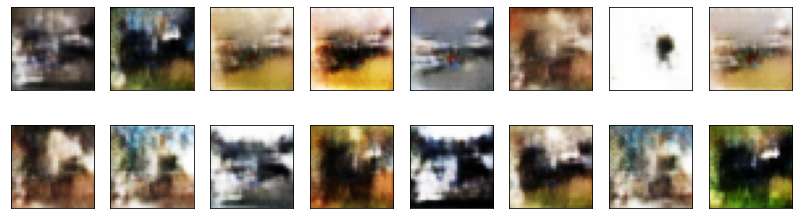

2023-07-19 03:03:32 | Epoch [46/50] | Batch 0/391 | d_loss: 0.4503 | g_loss: 4.2573
2023-07-19 03:03:51 | Epoch [46/50] | Batch 100/391 | d_loss: 0.7704 | g_loss: 4.7819
2023-07-19 03:04:10 | Epoch [46/50] | Batch 200/391 | d_loss: 0.5558 | g_loss: 2.8526
2023-07-19 03:04:28 | Epoch [46/50] | Batch 300/391 | d_loss: 0.5417 | g_loss: 3.7377


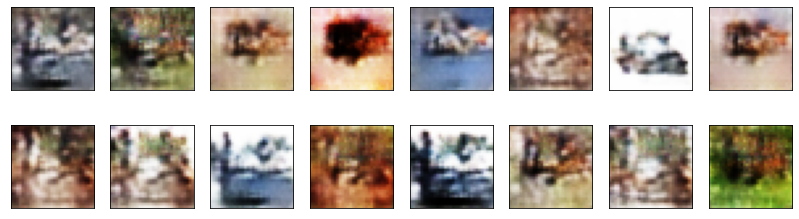

2023-07-19 03:04:48 | Epoch [47/50] | Batch 0/391 | d_loss: 0.8317 | g_loss: 3.4759
2023-07-19 03:05:06 | Epoch [47/50] | Batch 100/391 | d_loss: 0.5229 | g_loss: 4.0302
2023-07-19 03:05:25 | Epoch [47/50] | Batch 200/391 | d_loss: 0.4657 | g_loss: 4.3789
2023-07-19 03:05:43 | Epoch [47/50] | Batch 300/391 | d_loss: 0.5599 | g_loss: 3.1625


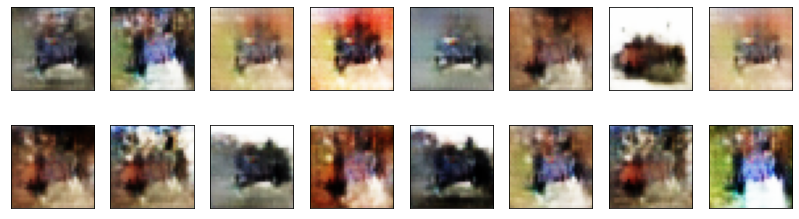

2023-07-19 03:06:07 | Epoch [48/50] | Batch 0/391 | d_loss: 0.5380 | g_loss: 3.3272
2023-07-19 03:06:37 | Epoch [48/50] | Batch 100/391 | d_loss: 0.5448 | g_loss: 2.8882
2023-07-19 03:07:07 | Epoch [48/50] | Batch 200/391 | d_loss: 0.5540 | g_loss: 2.4152
2023-07-19 03:07:37 | Epoch [48/50] | Batch 300/391 | d_loss: 0.4456 | g_loss: 4.0820


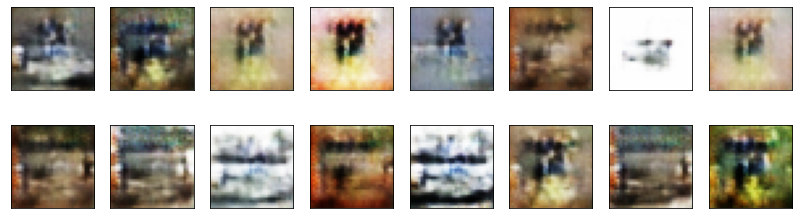

2023-07-19 03:08:07 | Epoch [49/50] | Batch 0/391 | d_loss: 0.5598 | g_loss: 3.8963
2023-07-19 03:08:38 | Epoch [49/50] | Batch 100/391 | d_loss: 0.5863 | g_loss: 3.4335
2023-07-19 03:09:08 | Epoch [49/50] | Batch 200/391 | d_loss: 0.5060 | g_loss: 4.2326
2023-07-19 03:09:29 | Epoch [49/50] | Batch 300/391 | d_loss: 0.6802 | g_loss: 4.6410


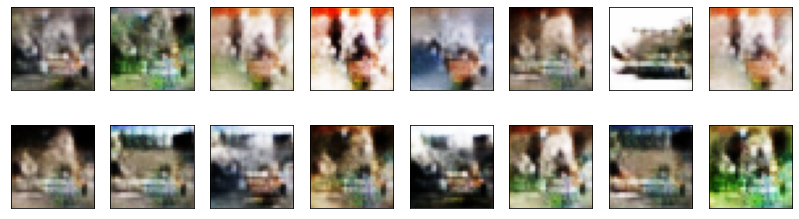

2023-07-19 03:09:53 | Epoch [50/50] | Batch 0/391 | d_loss: 0.4746 | g_loss: 3.7328
2023-07-19 03:10:23 | Epoch [50/50] | Batch 100/391 | d_loss: 0.6094 | g_loss: 3.6727
2023-07-19 03:10:53 | Epoch [50/50] | Batch 200/391 | d_loss: 0.6511 | g_loss: 5.1039
2023-07-19 03:11:23 | Epoch [50/50] | Batch 300/391 | d_loss: 0.4378 | g_loss: 4.2693


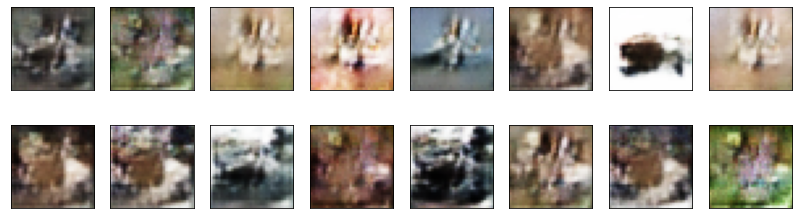

In [21]:
# training hyperparams
num_epochs = 50

# keep track of loss and generated, "fake" samples
samples = []
losses = []

print_every = 100

# Get some fixed data for sampling. These are images that are held
# constant throughout training, and allow us to inspect the model's performance
sample_size=16
# fixed_z = np.random.uniform(-1, 1, size=(sample_size, z_size, 1, 1))
# fixed_z = torch.from_numpy(fixed_z).float()
fixed_z = get_random_latent_batch(sample_size, z_size)

# train the network
for epoch in range(num_epochs):
    
    for batch_i, (real_images, _) in enumerate(train_loader):
                
        batch_size = real_images.size(0)
        
        # important rescaling step
        real_images = scale(real_images)
        
        if train_on_gpu: real_images = real_images.cuda()
        
        # ============================================
        #            TRAIN THE DISCRIMINATOR
        # ============================================
        ####
        # IMPLEMENT HERE
        ####
        d_optimizer.zero_grad()
        # 1. Compute discriminator loss on real, training images
        d_real_out = D(real_images)
        d_real_loss = real_loss(d_real_out, True)
        # 2. Generate random fake images
        # gradients don't have to flow
        with torch.no_grad():
            z = get_random_latent_batch(batch_size, z_size)  
            fake_imgs = G(z)
            
        # 3. Compute the discriminator loss on fake, generated images
        d_fake_out = D(fake_imgs.detach()) # Detach got from solution video
        d_fake_loss = fake_loss(d_fake_out)
        
        # 4. Add up real and fake loss
        d_loss = d_real_loss + d_fake_loss
        
        #5. Perform backpropagation + an optim step to update weights
        d_loss.backward()
        d_optimizer.step()
        
        
        # =========================================
        #            TRAIN THE GENERATOR
        # =========================================
        ####
        # IMPLEMENT HERE
        ####
        g_optimizer.zero_grad()
        
        # 1. Generate random fake images        
        z = get_random_latent_batch(batch_size, z_size)
        fake_imgs = G(z)
        
        #2. Compute the discriminator loss on fake images using flipped labels
        d_fake_out = D(fake_imgs) # Detach got from solution video
        g_loss = real_loss(d_fake_out) # real loss to flip label
        
        # 3. Perform backpropagation + optim step to update weights
        g_loss.backward()
        g_optimizer.step()

        # Print some loss stats
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            losses.append((d_loss.item(), g_loss.item()))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{num_epochs}] | Batch {batch_i}/{len(train_loader)} | d_loss: {d_loss.item():.4f} | g_loss: {g_loss.item():.4f}')
    
    ## AFTER EACH EPOCH##    
    # generate and save sample, fake images
    G.eval() # for generating samples
    if train_on_gpu:
        fixed_z = fixed_z.cuda()
    samples_z = G(fixed_z)
    samples.append(samples_z)
    view_samples(-1, samples)
    G.train() # back to training mode


# Save training generator samples
with open('train_samples.pkl', 'wb') as f:
    pkl.dump(samples, f)

## Training loss

Here we'll plot the training losses for the generator and discriminator, recorded after each epoch.

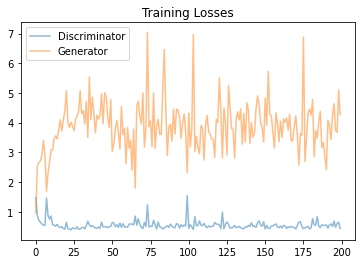

In [22]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()